# Percentile method

The goal is to show that causal impact is not related necessarily to the most central node. What defines a node to be most central depends on the context. Often a assumption of "connectedness" is made, i.e. nodes with high degree are deemed more important than nodes with lesser degree. What we propose is an alternative method using information theory which has several advantages. Primarily, information theory uses probability distributions, allowing (1) observation only to be used in ranking node on dynamic importance, and (2) are blind of the mechanisms that generate to these distributions; This allows for mapping dynamic importance in situations where there is no clear way, or no current method that allows for causal analysis of the system, e.g. the climate or complex-networks such as protein-protein networks.

Consequently, we hypothesize that nodes with that rank high in terms of centrality, does not necessarily reflect nodes with high causal impact. The metrics proposes, informational impact, in contrast is able to accurately reflect causal impact in complex dynamical networks

## The method
The direct hypothesis is that centrality metrics does not necessarily reflect high causal impact. Causal impact is defined as the integral of the KL-divergence between an intervened and unintervened distribution. Informational impact is defined similarly but using the probabilitiy distributions using the unintervened distribution. How can we assure that there exists only one driver-node in the network? In reality, we can't as it is currently unclear how to identify driver-nodes in complex dynamical networks; as such we extract the area under the curve per node for causal impact. The area under the curve, however, will not guarantee a singular node to be the driver-node in any arbritrary network structure. As such we porpose a method that exracts the number of driver-nodes using overlapping confidence interval method. This method extracts the max area under the curve value per simulations after which a confidence intervals are computed and estimated how many driver-nodes are present in this label-vector (figure X). 

The driver-set will be used as label indicator. We hypothesize that on average the percentile of informational impact will be higher for nodes identified as causally important than for any centrality metrics. 


In [102]:
import sys, os
sys.path.insert(0, '../')
from matplotlib import style
style.use('seaborn-poster')
import matplotlib.pyplot as plt, numpy as np, networkx as nx
from Utils.stats import driverNodeEstimate
from Utils import IO

fn = 'data2019-11-11T11:24:16.310143.pickle'
for k, v in IO.loadPickle(fn).items():
    print(f'Loading {k}')
    globals()[k] = v

print(aucs.keys())
s = next(iter(settings))
setting = settings[s]



Loading aucs
Loading data
Loading rdata
Loading settings
Loading coeffs
dict_keys(['/var/scratch/cveltere/tester/2019-10-07T12:37:57.770156', '/var/scratch/cveltere/tester/2019-10-07T12:37:59.585120', '/var/scratch/cveltere/tester/2019-10-07T12:38:01.219213', '/var/scratch/cveltere/tester/2019-10-14T07:46:52.816297', '/var/scratch/cveltere/tester/2019-10-14T07:46:53.453355', '/var/scratch/cveltere/tester/2019-10-14T07:46:55.128018', '/var/scratch/cveltere/tester/2019-10-14T07:47:19.581611', '/var/scratch/cveltere/tester/2019-10-16T10:54:41.340793', '/var/scratch/cveltere/tester/2019-10-16T10:54:44.511811', '/var/scratch/cveltere/tester/2019-10-16T10:54:47.722743', '/var/scratch/cveltere/tester/2019-10-16T10:54:48.274841', '/var/scratch/cveltere/tester/2019-10-16T10:54:48.281020', '/var/scratch/cveltere/tester/2019-10-16T10:54:59.050361', '/var/scratch/cveltere/tester/2019-10-16T15:57:15.895559', '/var/scratch/cveltere/tester/2019-10-16T15:57:24.802926', '/var/scratch/cveltere/tester/20

[[0.44594802 0.32862801]
 [0.44594802 0.32862801]
 [0.44594802 0.32862801]]
[0 0 0]
[[0.44594802 0.32862801]
 [0.44594802 0.32862801]
 [0.50840117 0.05840959]]
[0 0 1]
[[0.44594802 0.32862801]
 [0.44594802 0.32862801]
 [0.6654238  0.44386395]]
[0 0 2]
[[0.44594802 0.32862801]
 [0.50840117 0.05840959]
 [0.50840117 0.05840959]]
[0 1 1]
[[0.44594802 0.32862801]
 [0.50840117 0.05840959]
 [0.6654238  0.44386395]]
[0 1 2]
[[0.44594802 0.32862801]
 [0.6654238  0.44386395]
 [0.6654238  0.44386395]]
[0 2 2]
[[0.50840117 0.05840959]
 [0.50840117 0.05840959]
 [0.50840117 0.05840959]]
[1 1 1]
[[0.50840117 0.05840959]
 [0.50840117 0.05840959]
 [0.6654238  0.44386395]]
[1 1 2]
[[0.50840117 0.05840959]
 [0.6654238  0.44386395]
 [0.6654238  0.44386395]]
[1 2 2]
[[0.6654238  0.44386395]
 [0.6654238  0.44386395]
 [0.6654238  0.44386395]]
[2 2 2]


In [103]:
%load_ext autoreload
%autoreload 2
from scipy.stats import percentileofscore as pcs
# estimate the max values
# tmp = np.array([i for i in aucs.values()])

from itertools import product
# ndata, nodes, ntrials, npulse, ntemp = tmp.shape
npulse = len(setting.get('pulseSizes')) + 1
ntemp  = len(setting.get('equilibrium')['ratios'])


    
# driverNodes = {key : np.zeros(npulse, ntemp, dtype = set) for key in data.keys()}
# driverNodes = np.zeros((ndata, npulse, ntemp), dtype = set)
# overlaps = {key : }
# overlaps    = np.zeros((ndata, npulse, ntemp), dtype = float)
alpha = .05

# idx = tmp.argmax(1) 



centralities = dict(\
                   degree = nx.degree_centrality,\
                   betweenness = nx.betweenness_centrality,\
                   closeness  = nx.closeness_centrality,\
#                    percolation = nx.percolation_centrality,\
                   eigenvector = nx.eigenvector_centrality,\
#                    dispersion = nx.dispersion,\
#                     vote_rank = nx.algorithms.centrality.voterank,\
#                     second_order = nx.second_order_centrality,\
#                    current_flow = nx.current_flow_betweenness_centrality,\
                   )


conditions = len(centralities) + 1

overlaps    = {}
driverNodes = {}
pscores = {}

taucs = {}

from scipy import integrate
# setup dictionaries
for key in data:
    driverNodes[key] = np.zeros((npulse, ntemp), dtype = set)
    overlaps[key] = np.zeros((npulse, ntemp), dtype = float)
    pscores[key] = np.zeros((npulse, ntemp, conditions))
    
    taucs[key] = np.trapz(data.get(key), axis = -1)

from Utils.stats import driverNodeEstimateSEM
from collections import Counter
kind = 'weak'
combinations = product(*[data.keys(), range(npulse), range(ntemp)])

for (dataidx, pulseidx, tempidx) in combinations:
    # get result data
    graph = settings[dataidx].get('graph')
    model = settings[dataidx].get('model')
    
#     model = model(graph)
    
    # get aucs and create ranks
    idx   = aucs.get(dataidx)
    
#     print(idx.shape)
    ranks = idx[..., pulseidx, tempidx]
#     ranks = ranks.mean(1)
#     ranks = ranks.argmax(0)
#     t = Counter(ranks)
#     drivers=  set(t.keys())
#     drivers = set([sorted(t.items(), key = lambda x : x[1])[::-1][0][0]])
#     print(t, ); assert 0
#     drivers = set([ranks.argmax()])
#     print(dataidx, pulseidx, tempidx, ranks)
    # estimate driver nodes 
#     drivers = driverNodeEstimate(ranks.tolist(), alpha = alpha)
    drivers = driverNodeEstimateSEM(ranks, alpha = alpha)
    driverNodes[dataidx][pulseidx, tempidx] = drivers
    
    midrivers = driverNodes[dataidx][0, tempidx]
    
    inter = drivers.intersection(midrivers)
    union = drivers.union(midrivers)

    overlap = len(inter) / len(union)
    overlaps[dataidx][pulseidx, tempidx] = overlap 
    
    
    d = aucs[dataidx][:, :, 0, tempidx]
    d = d.mean(1) # average over trials
    
    e = d[list(drivers)]
    d = [i for idx, i in enumerate(d) if idx not in drivers] 
    d = np.array(d)
    
    score = np.mean([pcs(d, i, kind = kind) for i in e])
    
#     print('>>', dataidx, pulseidx, tempidx)
#     print(drivers, score)
    pscores[dataidx][pulseidx, tempidx, 0] = score
    
 
#     print(graph.nodes, dataidx)
#     print(dataidx, drivers)
    for cidx, (cent, cf) in enumerate(centralities.items()):
        centVals = cf(model.graph)
        
        vals = [centVals.get(model.rmapping[d]) for d in drivers]
        d = np.fromiter(centVals.values(), dtype = 'float')
        d = [i for idx, i in enumerate(d) if idx not in drivers]
        d = np.array(d)
        score = np.mean([pcs(d, i, kind = kind) for i in vals])
        pscores[dataidx][pulseidx, tempidx, cidx + 1] = score

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Overlap driver-node estimates

The figure below shows how the statistical procedure produces similar driver-node estimates applied the informaitonal impact data or the causal impact data.

<ipython-input-104-23ecc0362c12>:23: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


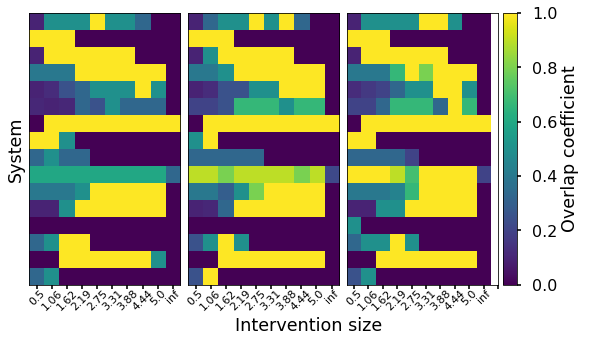

In [104]:
pulses = setting.get('pulseSizes')
xr = np.arange(len(pulses) + 1)
%matplotlib inline
fig, ax = plt.subplots(1, ntemp, figsize = (10, 5), \
                       sharex = 'all', sharey = 'all')
for temp in range(ntemp):
    tax = ax[temp]
    h = tax.imshow([i[1:, temp] for i in overlaps.values()], \
                   vmin = 0, vmax = 1, aspect = 'auto')
    tax.set_yticks([])
    tax.set_xticks(xr)
    tax.set_xticklabels(np.round(pulses, 2), \
                    rotation = 45, fontsize = 11,\
                    )
    tax.tick_params(axis = 'x', pad = .1)
    
fig.subplots_adjust(wspace = 0.05)
mainax = fig.add_subplot(111, xticks = [], yticks = [], frameon = 0)
mainax.set_xlabel('Intervention size', labelpad = 32)
ax[0].set_ylabel('System')
fig.colorbar(h, ax = ax, label = 'Overlap coefficient', pad = 0.01)

fig.show()

In [91]:
%load_ext autoreload
%autoreload 2
import ipywidgets as widgets
from scipy.stats import norm

from Utils.stats import bootStrap, bootStrapDrivers
tmp = np.array([ i for i in aucs.values()])
tmp = tmp[1]

dataSlider = widgets.SelectionSlider(options = list(aucs.keys()))
tempSlider = widgets.IntSlider(min = 0, max = 2)
pulseSlider= widgets.IntSlider(min = 0, max = 10)


N = int(1e4)
n = 10
alpha = .5
def s(x):
    return x



%matplotlib widget
fig, ax = plt.subplots(figsize = (7, 5))
colors = plt.cm.tab20(range(10))
fig.show()

DRIVERS = {}
@widgets.interact(dataidx = dataSlider, tempi = tempSlider,\
                 pulsi = pulseSlider)
def update(dataidx, tempi, pulsi):
    ranks = aucs.get(dataidx)[..., pulsi, tempi]
    boots, _, drivers = bootStrapDrivers(ranks.T, N, len(ranks.T), alpha)
    

    print(drivers)
    ax.cla()
    
    elems = []
    for idx, i in enumerate(boots.T):
        counts, bins = np.histogram(i, bins = 100, density = 1)
        
        bins = (bins[:-1] + bins[1:]) / 2
#     ax.set_yscale('log')
        counts = (counts - counts.min()) / (counts.max() - counts.min())
        ax.fill_between(bins, 0, counts, color = colors[idx], \
                       label = f'{idx}*' if idx in drivers else idx, alpha = .5)
        elems.append(plt.Line2D([], [], color = colors[idx], \
                               marker = 'o',\
                               linestyle = 'none', \
                            label = f'{idx}*' if idx in drivers else idx))
            
        
    ax.set_ylabel('frequency')
    ax.set_xlabel('value')
#     ax.set_title(dataidx)
    
    ax.legend(handles = elems, bbox_to_anchor = (1, 1), loc = 'upper left')
    fig.tight_layout()
#     ax.tick_params(axis = 'x', fontsize = 5)
#     ax.tick_params(axis = 'y', fontsize = 5)
#     ax.set_ylim(0, )




The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

interactive(children=(SelectionSlider(description='dataidx', options=('/var/scratch/cveltere/tester/2019-10-07…

In [113]:
%load_ext autoreload
%autoreload 2
DRIVERS = {}
alpha = .5
from tqdm import tqdm_notebook as tqdm
from Utils.stats import bootStrapDrivers

centralities = dict(\
                   degree = nx.degree_centrality,\
                   betweenness = nx.betweenness_centrality,\
                   closeness  = nx.closeness_centrality,\
                   eigenvector = nx.eigenvector_centrality,\
                   )
CENTDRIVERS = {}
ALLDRIVERS = {}
BINNEDDRIVERS = {}
alpha = .01

N = int(1e4)
# for all aucs

from Utils.stats import bootStrapThresholds
alphas = np.linspace(0.1, 1, 10)
alphas  = np.array([0, .05])
structuralData = {}
for k, setting in settings.items():
    m = setting.get('model')
    g = m.graph
    
    buffer = np.zeros((m.nNodes))
    centData = {}
    for condition, cf in centralities.items():
        c = cf(g)
        for node, val in c.items():
            idx = m.mapping[node]
            buffer[idx] = val
        MAX = buffer.max()
        cdrivers = np.where(buffer == MAX)[0]
        centData[condition] = cdrivers
    structuralData[k] = centData
alphaData = bootStrapThresholds(aucs, structuralData, alphas, int(1e4))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [114]:
from Utils.stats import computeMatchScore
for k, v in alphaData.items():
    alphas = list(v.keys())
    print(v.keys())
    for alpha in  alphas:
        tmp = v.get(alpha)
#         print(type(tmp))
        ALLDRIVERS = tmp.get('ALLDRIVERS')
        overlaps, driverSizes = computeMatchScore(ALLDRIVERS)
        tmp['overlaps'] = overlaps
        tmp['driverSizes'] = driverSizes
        v[alpha] = tmp

dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])
dict_keys([0.0, 0.05])


<ipython-input-115-7dc0639e4082>:29: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


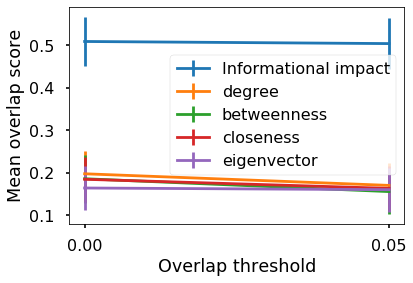

In [115]:
performance = np.zeros((len(aucs), len(alphas), 5))

scorer = np.mean
for idx, (k, v) in enumerate(alphaData.items()):
    for jdx, (alpha, aData) in enumerate(v.items()):
        
#         print(aData['overlaps'].shape); assert 0 
        performance[idx, jdx] = scorer(\
                                       aData.get('overlaps').reshape(-1, 5),\
                                       
                                       axis = 0)
    
from scipy.stats import sem
fig, ax = plt.subplots()

colors =  plt.cm.tab10(range(conditions))
conditionLabels = ['Informational impact', *list(centralities.keys())]
for i in range(5):
    tmp = performance[..., i]
#     tmp = tmp.mean(0)
    ax.errorbar(alphas, scorer(tmp, 0), sem(tmp, 0), color = colors[i], label = conditionLabels[i])
# ax.errorbar(alphas, np.max(performance, 0), sem(performance, 0), label = 'max')
ax.set_xticks(alphas)
ax.set_ylabel('Mean overlap score')
ax.set_xlabel("Overlap threshold")
ax.legend()
fig.savefig('Overlap_threshold.svg', bbox_inches = 'tight',\
           pad_inches = 0)
fig.show()

(16, 11, 3)


<ipython-input-185-bb0ea67f8dda>:44: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout()


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


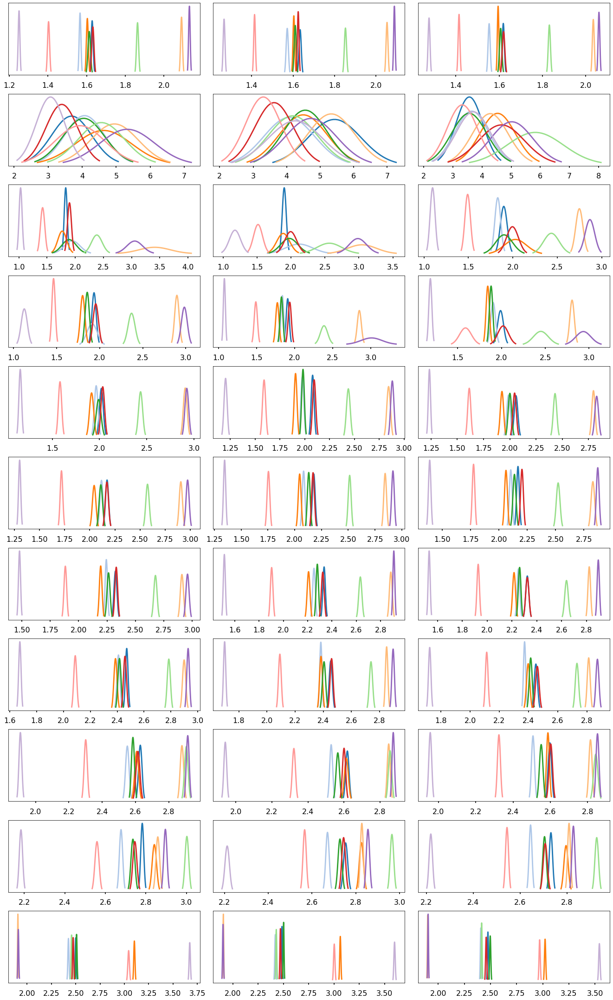

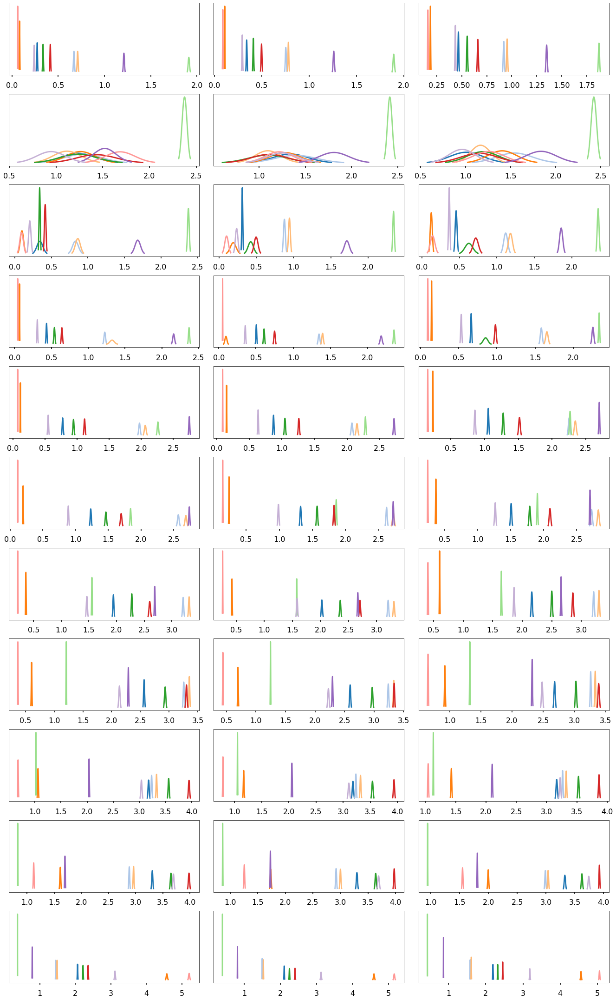

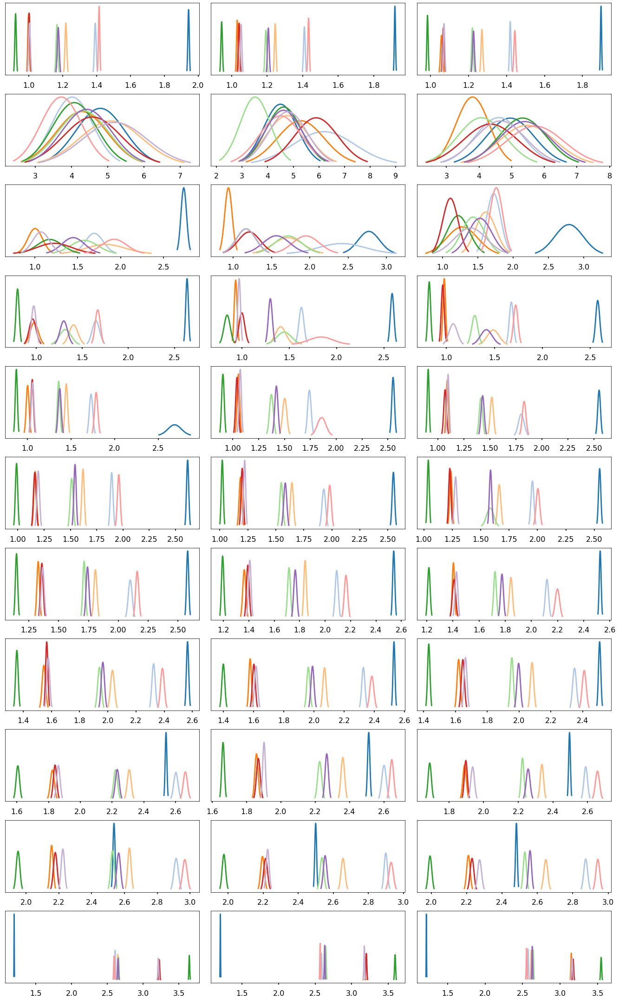

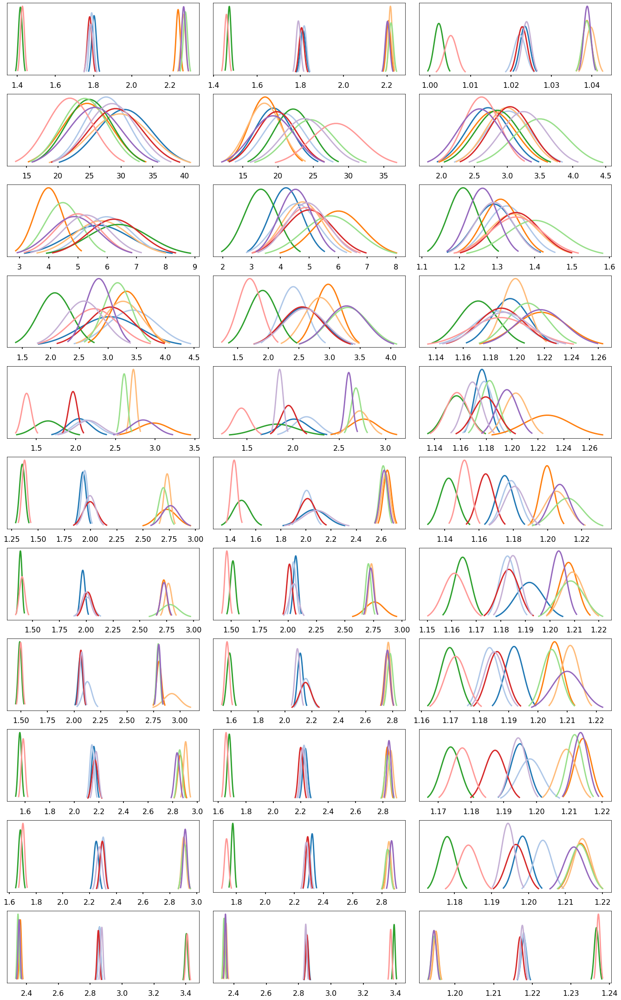

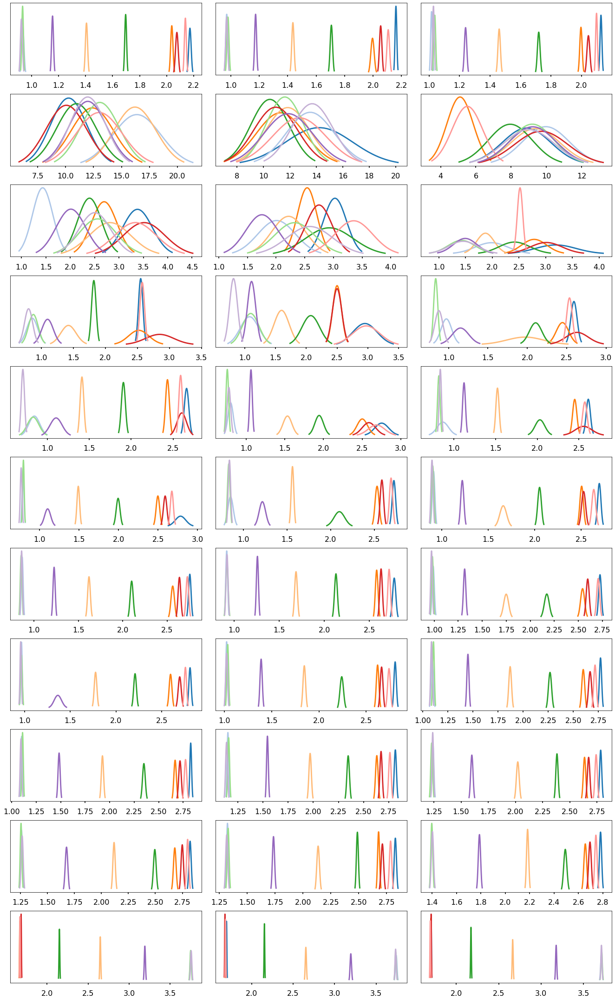

...

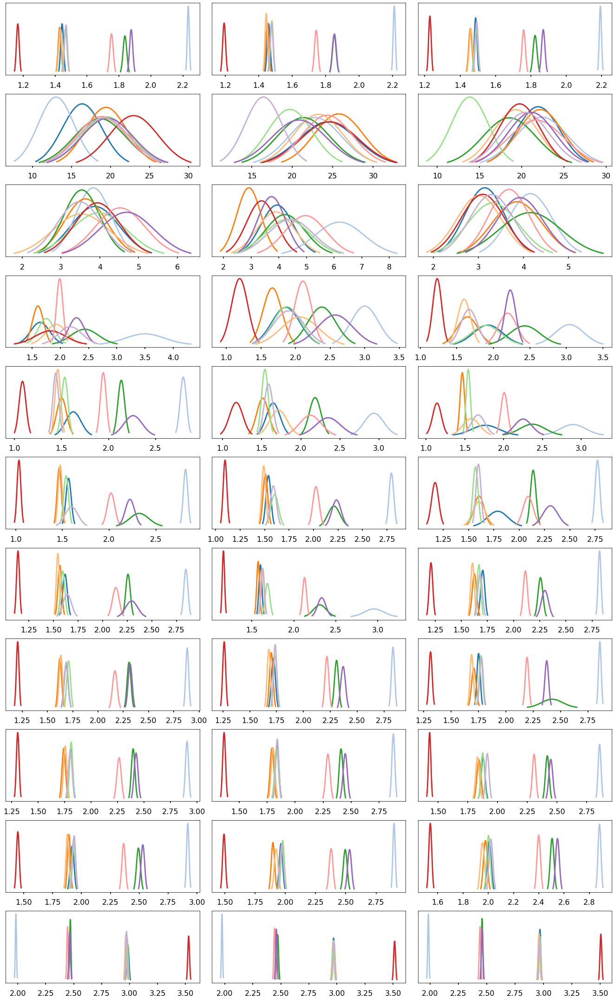

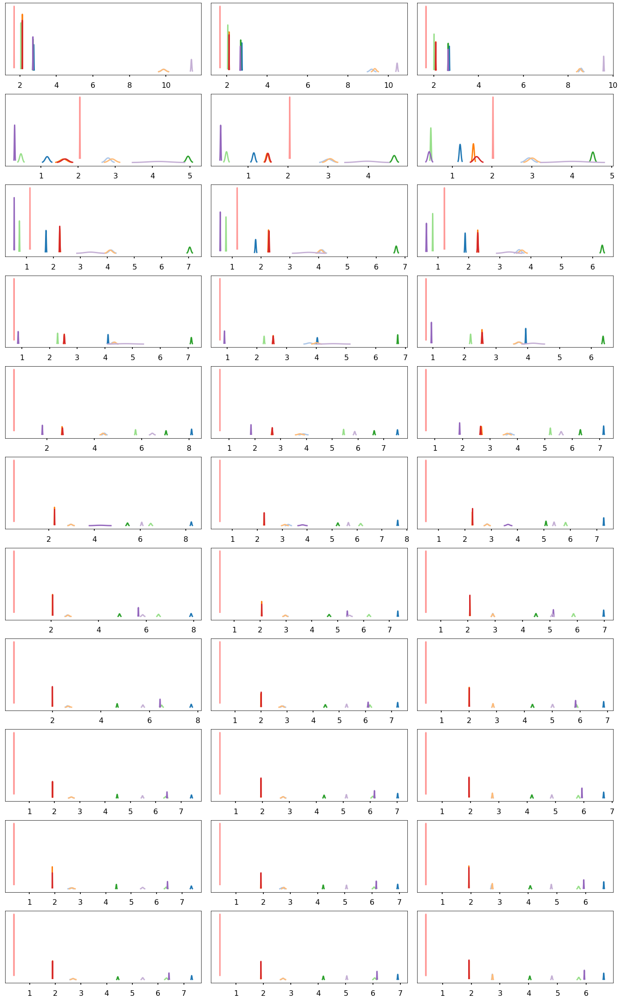

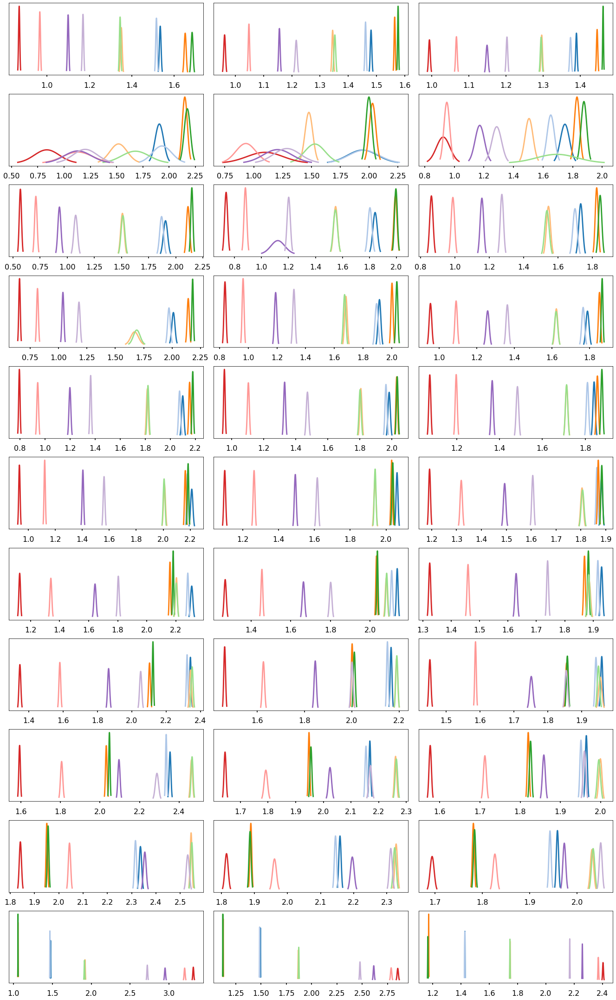

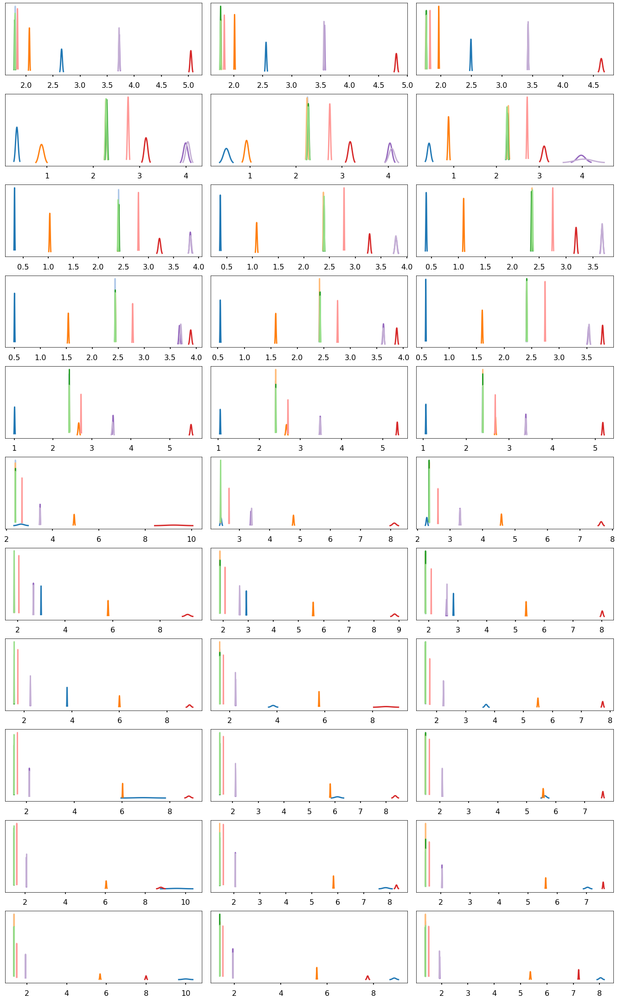

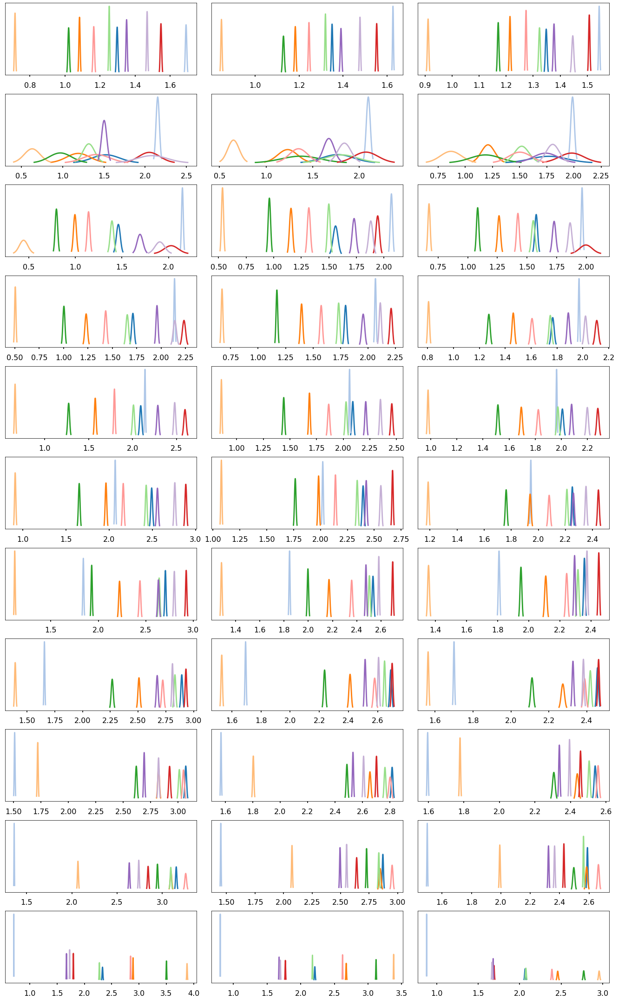

In [185]:
from scipy.stats import norm
bestAlpha = np.moveaxis(performance, 2, 1).reshape(-1, len(alphas)).mean(0).argmax()
bestAlpha = alphas[bestAlpha]
BINNEDDRIVERS = [i.get(bestAlpha).get('BINNEDDRIVERS') for i in alphaData.values()]
tmp = np.array(BINNEDDRIVERS, dtype = dict)
# tmp = np.array([ i for i in BINNEDDRIVERS.values()], dtype = dict)
print(tmp.shape)
ndata, nconds, ntemps = tmp.shape
# nconds = 5
%matplotlib inline
colors = plt.cm.tab20(range(10))


# xr = np.logspace(-2, 1, 50)

theta = .01
xr = np.geomspace(1, 10, 20)
# ax  = np.zeros((ndata, nconds), dtype = object)

for di, d in enumerate(tmp):
    fig = plt.figure(constrained_layout = 1,\
                figsize = (20, 30),\
                )

    wr = np.ones(ntemps + 1)
    wr[-1] = .2
    gs = fig.add_gridspec(nrows = nconds, ncols = ntemps + 1, width_ratios = wr)
    for (ci, ti) in product(*map(range, (npulse, ntemp))):
        axi = fig.add_subplot(gs[ci, ti])
        dj = d[ci, ti]

        means = np.array([mean for mean, _ in dj.values()])
        xr = np.linspace(means.min() - .2, means.max() + .2, 1000)
        e = np.zeros((len(d), xr.size))
        for nodeidx, (node, (mean, loc)) in enumerate(dj.items()):
    #             left, right = [norm.ppf(i, *normit[nodeidx]) for i in (theta, 1 - theta)]
            left, right = [norm.ppf(i, mean, loc) for i in (theta, 1 - theta)]
            xr = np.linspace(left, right, N)
            y  = norm.pdf(xr, mean, loc)
            axi.plot(xr, y, color = colors[nodeidx])

        axi.set_yticks([])
    # fig.subplots_adjust(wspace = 0.05, hspace = .55)
    fig.tight_layout()
    # axi = fig.add_subplot(gs[:, -1])
    # fig.colorbar(h, cax = axi)
    print(di)
    fig.savefig(f'system-{di}.svg', pad_inches = 0, bbox_inches = 'tight',\
               transparent = 1)

<ipython-input-117-a6b7ce263730>:90: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


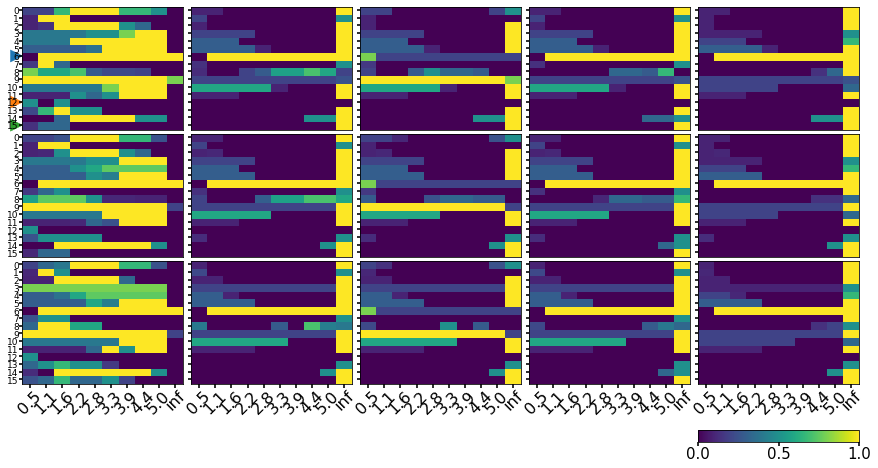

In [117]:
overlaps = np.array([i.get(bestAlpha).get('overlaps') for i in alphaData.values()])
ALLDRIVERS = {k : i.get(bestAlpha).get('ALLDRIVERS') for k, i in alphaData.items()}
driverSizes = np.array([i.get(bestAlpha).get('driverSizes') for i in alphaData.values()])
%matplotlib inline
hs = np.ones(5)
hs[-2] = .3
hs[-1] = .1
gs = dict(\
         height_ratios = hs,\
         )

figsize = (15, 8)
fig, ax = plt.subplots(5, 5, figsize = figsize, \
#                        sharex = 'row', sharey = 'row',\
                      gridspec_kw = gs)
t  = ['/var/scratch/cveltere/tester/2019-10-16T10:54:59.050361',\
          '/var/scratch/cveltere/tester/2019-10-14T07:47:19.581611',\
          '/var/scratch/cveltere/tester/2019-10-16T15:57:27.814220']

targets = {}
idx = 0
for jdx, k in enumerate(ALLDRIVERS.keys()):
    if k in t:
        targets[k] = jdx
        idx += 1

pulses = np.array(next(iter(settings.values())).get('pulseSizes')).round(1)

labels = ['Informational\n impact', *centralities.keys()]

from itertools import product

ntemp = 3
cmap = plt.cm.viridis
colorsGraphs = plt.cm.tab10(range(len(t)))
for (condition, temp) in product(*map(range, ax.shape)):
    axj = ax[temp, condition]
    if condition < conditions  and temp < ntemp:
        
        axj.set_xticks(np.arange(len(pulses)))
        axj.set_xticklabels(pulses, rotation = 45, fontsize = 16)
        axj.tick_params(axis = 'x', pad = 0)
        xr = np.arange(len(aucs) + 1)
        w = np.diff(xr)[0] /(xr.size *.5)
        axj.set_yticks(xr - w)

        if condition == 0:
            axj.set_yticklabels(xr, fontsize = 9)
            axj.tick_params(axis = 'y', pad = 0, zorder = 5)
        else:
            axj.set_yticklabels([])
        if condition < conditions  and temp < ntemp - 1:
            axj.set_xticklabels([])
            axj.set_xticks([])
            
            
        h = axj.imshow(overlaps[...,1:, temp, condition],\
                       vmin = 0, vmax = 1,\
                       cmap = cmap,\
                           alpha = 1,
                       aspect = 'auto',\
                          )
        if temp == 0 :
#             axj.set_title(labels[condition], fontsize = 20)
            
            if condition == 0:
                for puti, (k, put) in enumerate(targets.items()):
                    axj.annotate('', (-.45, put - w),  \
                             xytext=(-.5, put + - w), \
                             arrowprops=dict(arrowstyle="-|>",
                             connectionstyle="arc3",\
                            mutation_scale = 30,\
                            color = colorsGraphs[puti],\
                            zorder =1), zorder  = 1)
 

    else:
        axj.axis('off')


m = ax[-1,-1]
m.axis('on')
m.set_xlabel('Avg. Percentile score')
m.tick_params(axis = 'x', pad = 0, size = 4)

fig.subplots_adjust(wspace = 0.05, hspace = .05)
fig.colorbar(h, cax = m, orientation = 'horizontal').ax.tick_params(labelsize = 15)
fig.savefig('overlap_main.svg', bbox_inches = 'tight',\
           pad_inches = 0, transparent = 1, dpi = 300)
fig.show()


In [90]:
# %load_ext autoreload
# %autoreload 2
# from Utils.stats import bootStrapDriversEfron as bse, bootStrapDrivers as bsd

# k = next(iter(aucs))
# p, t = -1, 0
# tmp = aucs[k][..., p, t]
# d = data[k][..., p, t, :].mean(1)
# print(d.shape)
# drivers = bse(tmp.T, 1000, batch = 20)
# D = bsd(tmp.T, 1000, batch = 1000, alpha = .15)[1]
# print(drivers, D.keys())
# %matplotlib widget
# fig, ax = plt.subplots()
# colors = plt.cm.tab20(range(10))
# for i in range(10):
#     ax.plot(d[i, :], color = colors[i], \
#             label = i)
# ax.legend()
# print(drivers)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
(10, 14)
[0 1 2 3 4 5 6 7 8] 9
0 0.0 -131.4020551888495
1 0.0 -139.87419450068467
2 0.0 -61.36358899527672
3 0.486 -227.14417354263463
4 0.0 -134.64975689782216
5 0.0 -137.78464748939635
6 0.0 -133.29352029301776
7 0.0 -59.359752837144
8 0.453 -208.65535962511603
{8, 9, 3} dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

{8, 9, 3}


['Degree', 'Betweenness', 'Closeness', 'Eigenvector']


<ipython-input-118-6632fff41d8e>:77: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


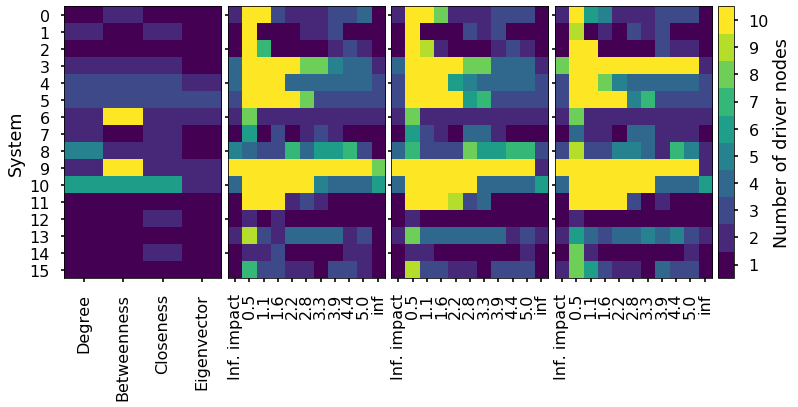

In [118]:
centSizes = np.zeros((len(aucs), conditions - 1))
for dataidx, (dataname, cents) in enumerate(structuralData.items()):
    for condition, (cenF, vals) in enumerate(cents.items()):
        centSizes[dataidx, condition] = len(vals)

from matplotlib import gridspec
hs = np.ones(5)
hs[-2] = .3
hs[-1] = .1

gs = dict(\
#          width_ratios = hs\
         )

wr = np.ones(5)
wr[-1] = .1
gs = gridspec.GridSpec(ncols = 5, nrows = 1, width_ratios = wr)

fig = plt.figure(constrained_layout = 0,\
                figsize = (12, 5),\
                )

import matplotlib
from_list = matplotlib.colors.LinearSegmentedColormap.from_list

n = 10
cmap = plt.cm.get_cmap('viridis', n)
# cmap = from_list(None, plt.cm.viridis(range(0,n)), n)

tpulse = ['Inf. impact', *pulses.round(1)]
for temp in range(ntemp):
    axi = fig.add_subplot(gs[temp + 1])

    xr = np.arange(len(tpulse))
    axi.set_xticks(xr)
    axi.set_xticklabels(tpulse, rotation = 90,\
                       )
    axi.set_yticklabels([])
    h = axi.imshow(driverSizes[...,  temp],\
              aspect = 'auto',\
              vmin = 1, vmax = 11, \
            
              cmap = cmap)
    

main = fig.add_subplot(gs[ 0])
main.set_yticklabels([])

labels = [i.capitalize() for i in centralities.keys()]

print(labels)
xr = np.arange(len(xr))
main.set_xticks(xr) 
main.set_xticklabels(labels, rotation = 90)
main.set_yticks(np.arange(len(aucs)))
main.imshow(centSizes, aspect = 'auto',\
           vmin = 1, vmax = 11,\
           cmap = cmap)

main.set_yticklabels(np.arange(len(driverSizes)))
main.set_ylabel('System')


fig.subplots_adjust(wspace = .05, hspace = .05)
cbar = fig.add_subplot(gs[-1, -1])
yl = np.arange(1, n + 1)
cbb = fig.colorbar(h, cax = cbar, ticks = yl + .5, label = 'Number of driver nodes')
# print(yl.size)


cbar.set_yticklabels(yl)
# cbb.set_ticks(yl)
# cbar.set_yticklabels(['t' for i in range(11)])
fig.savefig('numberDriver.pdf', \
           pad_inches = 0,\
           bbox_inches = 'tight')
fig.show()


In [119]:
from Utils.stats import ratio, bootStrap

error = 1e-3
inp = overlaps.reshape(-1, conditions) + error
# print(overlaps.shape); assert 0
N   = int(1e5)
Nbc = int(1e3)
# Nbc = len(inp)
boots = bootStrap(inp, ratio, N, Nbc)

inp = np.moveaxis(overlaps, 2, 1).reshape(-1, npulse, conditions) + error
# inp = overlaps + error
# Nbc = len(inp)
hboots = bootStrap(inp,ratio, N, Nbc)
# bin it estimate curves computer interval
interval = (0, 1)

print(hboots.shape)
allSets = np.concatenate((hboots, boots[:, None]), axis = 1)

binned = np.zeros((*allSets.shape[1:], 2), dtype = list)

for (condition, predictor) in product(*map(range, binned.shape[:-1])):
    
    c, b = np.histogram(allSets[:, condition, predictor], bins = 100, density = 1)
    b = (b[:-1] + b[1:])/2
    binned[condition, predictor] = c, b
    
# estimate density functions
from scipy.stats import norm

# gest worst distributions
worst = abs( allSets.mean(0)).argmin(-1)
# print(tmp.mean(0))
# print(worst, tmp.shape)
worst = np.array([allSets[...,idx, i] for idx, i in enumerate(worst)])

kdeFits = np.zeros((worst.shape[-1], 2))
for idx, di in enumerate(worst):
    kdeFits[idx] = norm.fit(di)

(100000, 11, 4)


(100000, 4) (100000, 11, 4)


<ipython-input-120-0d9715008367>:82: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


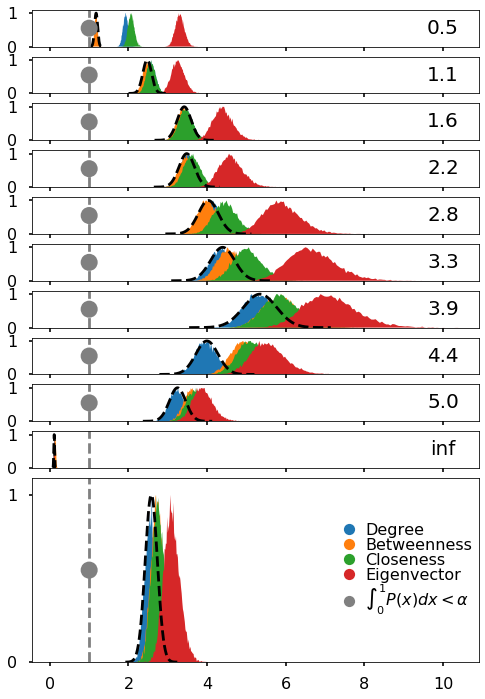

In [120]:
print(boots.shape, hboots.shape)
from matplotlib import patches
hs = np.ones(11)
hs[-1] = 5
gs = dict(\
         height_ratios = hs,\
         )

%matplotlib inline
fig, ax = plt.subplots(11, gridspec_kw = gs, \
                       figsize = (8, 12),\
                      sharex = 'all')
alpha = .001
for i in range(11):
    axi = ax[i]
    for c, b in binned[i + 1]:
        c = (c - c.min()) / (c.max() - c.min())
        axi.fill_between(b, 0, c)
    
    mean, loc = kdeFits[i + 1]
    
    start = 1e-5
    left, right = [norm.ppf(i, mean, loc) for i in (start, 1 - start)]
    xr = np.linspace(left, right, 1000)
    
    y = norm.pdf(xr, mean, loc)
    y = (y - y.min()) / (y.max() - y.min())
    axi.plot(xr, y, linestyle = 'dashed', color = 'k')
    
    if i != 10:
        axi.set_ylim(0, 1.1)
    else:
        axi.set_ylim(0, 1.1)
#     axi.set_xlim(0, 10)
#     axi.set_xscale('log')
    axi.axvline(1, color = 'gray', linestyle = 'dashed')
    axi.set_yticks([0, 1]) 
    
    pvalue = norm.cdf(1, mean, loc)
#     print(pvalue)
    if pvalue < alpha:
        bbox_props = dict(boxstyle="circle",\
                        ec = 'gray', lw=2,\
                        pad = 0, \
                        fc = 'gray')

        xi, xj, yi, yj = axi.axis()
        

#         patch = patches.Ellipse((1, axi.axis()[-1] / 2), height = height / hs[i],  width = width,  color = 'black', zorder = 5)
#         patch = patches.Circle((1, axi.axis()[-1] / 2), radius = .1, color = 'black', zorder = 5)
#         axi.add_artist(patch)
#         axi.axis('equal')
        axi.annotate(' ', (1, axi.axis()[-1] / 2), fontsize = 15, \
                     verticalalignment = 'center',\
                    horizontalalignment = 'center', \
                     bbox = bbox_props,\
                    )
    if i < len(pulses):
        axi.text(10, axi.axis()[-1] / 2, pulses[i].round(1), fontsize = 20, \
                 verticalalignment = 'center', horizontalalignment = 'center')


elems = []
colors = plt.cm.tab10(range(4))
for idx, c in enumerate(centralities):
    elems.append(plt.Line2D([], [], marker = 'o', linestyle = 'none',\
                           color = colors[idx],\
                           label = c.capitalize()))
elems.append(plt.Line2D([], [], marker = 'o', linestyle = 'none',\
                       color = 'gray',\
                       label = '$\int_0^1 P(x) dx < \\alpha$'))
axi.legend(handles = elems, loc = 'center right', borderaxespad = 0,\
          handletextpad = 0, frameon = 1,\
          edgecolor = 'white',\
          facecolor = 'white',\
          framealpha = 0,\
          labelspacing = 0)
fig.subplots_adjust(hspace = .2)
fig.savefig('new_conditionals.svg', bbox_inches = 'tight',\
           pad_inches = 0)
fig.show()

# Reverse compute scores 
## From causal to drivers

NameError: name 'predictors' is not defined

NameError: name 'boots' is not defined

# Point-wise

What do we want to show? We want to show how informational impact reflect causal importance well, but the centrality metrics not necessarily. So far, evidence points to the fact that the driver-nodes rank high in informational impact, but not necessarily in centrality. By using the reverse prediction, it shows that the mapping works both ways. This would be needed as if a metric would not yield perfect prediction, a higher ranked node could yield low causal impact generating the hypothesis invalid. For example, let's assume that for some intervention size a driverset $d$ is identified and on average scores high in the distribution of some predictor. However, rank 1 of that predictor is not in this set. In theory, rank 1 could redict a node that would be lower than the ones in $d$. 

dict_keys([])


(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)
(10, 11, 3) (5, 3) (11, 3)




# Main results

Average rank score for the driver-nodes identified by the statistical procedure above for different estimators and across increasing noise (rows). Visually, we see that informational impact scores higher on average (quantified below). Importantly, as the intervention size increases, informational impact will lose its performance, however centrality metrics will improve.  

In [17]:
%matplotlib widget
import ipywidgets as widgets
from scipy.stats import sem
from Utils.plotting import addGraphPretty

# dataSlider = widgets.SelectionSlider(options = data.keys())
dataSlider = widgets.Select(options = data.keys())
tempSlider = widgets.IntSlider(min = 0, max = 2)


pulseSlider = widgets.IntSlider(min = 1, max = npulse - 1)


%matplotlib widget
fig, (left, right) = plt.subplots(1, 2, figsize = (10, 7), sharey = 'all')
mainax = fig.add_subplot(111, frameon = 0,\
                        xticks = [],\
                        yticks = [])
mainax.set_xlabel('Time[step]', labelpad = 30)
# inax.axis('off')
@widgets.interact(dataName = dataSlider, \
                  temp = tempSlider, \
                  pulse = pulseSlider)
def update(dataName, temp, pulse):
    d = rdata.get(dataName)
    
    for idx, i in enumerate(data.keys()):
        if i == dataName:
            break
    print(ALLDRIVERS[dataName].shape)
    drivers = ALLDRIVERS[dataName][pulse, temp, 0]
    
    mainax.set_title(dataName + "\n" + str(drivers))
    g = settings.get(dataName).get('graph')
    
    nodes, trials, pulses, temps, deltas = d.shape
    colors = plt.cm.tab20(range(nodes))
    means = d.mean(1)
    sems  =  2 * np.std(d, axis = 1)
    xr = np.arange(d.shape[-1])
    
    left.cla(); right.cla()
    
    inax = right.inset_axes([.4, 0.4, .6, .6])
    addGraphPretty(g, ax = inax)
    inax.axis('off')
    for node in range(nodes):
        left.errorbar(xr, means[node, 0, temp], \
                      sems[node, 0, temp], \
                      color = colors[node],\
                      label = node)
        right.errorbar(xr, means[node, pulse, temp], \
                       sems[node, pulse, temp], \
                       color = colors[node],\
                       label = node)
    
    
    elems = [\
             plt.Line2D([], [], color = colors[node], \
                  label = f'{node}{"*" if node in drivers else ""}', \
                  marker = 'o', linestyle = 'None')\
                  for node in range(nodes)\
          ]
    left.set_ylabel(r'$I(s_i^{t_0 + t} ; S^{t_0})$')
    right.set_ylabel(r"$D_{KL}(P' \vert \vert P)$")
    right.legend(handles = elems, \
                 bbox_to_anchor = (1.0, 1), loc = 'upper left',\
                title = 'Node', title_fontsize = 20,\
                frameon = 0,\
                borderaxespad = 0)
    print(dataName)

<IPython.core.display.Javascript object>

interactive(children=(Select(description='dataName', options=('/var/scratch/cveltere/tester/2019-10-07T12:37:5…

# TIME PLOTS

(10, 50, 11, 3, 14)
(10, 50, 11, 3, 14)


<ipython-input-95-f4587979fb04>:76: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


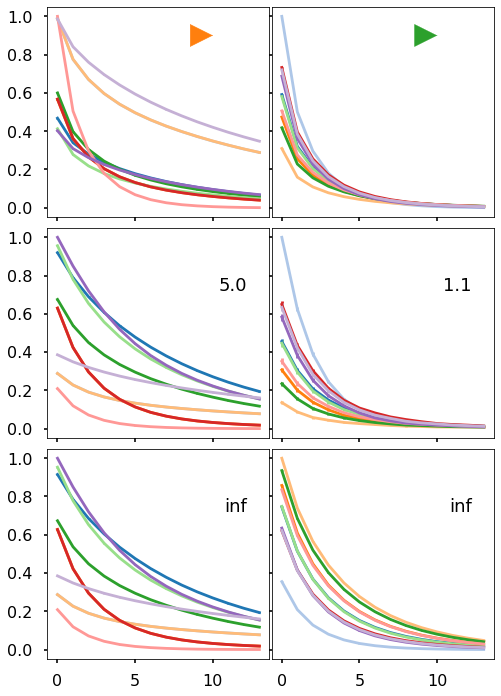

In [95]:
from scipy.stats import sem
# make panel highlighting a transition of driver-nodes for nudge sizes
dataname = '/var/scratch/cveltere/tester/2019-10-16T15:57:27.814220'
tmp = data[dataname]
nodes, trials, pulses, temps, deltas = tmp.shape
fig, ax = plt.subplots(3, 2, figsize = (8, 12),\
                      sharey = 'all', sharex =  'all')
mainax = fig.add_subplot(111, frameon = 0,\
                        xticks = [], \
                        yticks = [], \
                        )
# mainax.set_xlabel('Time (step)', labelpad = 32)

xr = np.arange(tmp.shape[-1])
idx = [[0, -2, -1], [0, 1, -1]]

pulses = settings[dataname].get('pulseSizes')
# labels = ['Mutual\ninformation',\
#          ]

graph = settings[dataname].get('graph')
colors = plt.cm.tab20(range(graph.number_of_nodes()))

start = 10
up    = .9

datanames = list(targets.items())[1:]

cColors = plt.cm.tab10(range(10))
for didx, (dataname, puti) in enumerate(datanames):
    tmp = data.get(dataname)
    print(tmp.shape)
    for i in range(3):
        axi = ax[i, didx]

        j = idx[didx][i]
        if i == 0: 
            color = colors[i]
            axi.annotate('', (start, up), xytext = (start - .01, up),\
                   arrowprops=dict(arrowstyle="-|>",
                     connectionstyle="arc3",\
                    mutation_scale = 55, color = cColors[didx + 1]),\
                    transform  = axi.transAxes)

    #         i
    #         continue
    #         axi.set_ylabel('$I(s_i^{t_0 + t}; S^{t_0})$')
    #         inax = axi.inset_axes([.5, .5, .47, .47])
    #         pos = nx.kamada_kawai_layout(graph)
    #         pos = nx.rescale_layout(pos, 1)
    #         addGraphPretty(graph, ax = inax, positions = pos)
    #         inax.axis('equal')
    #         inax.axis('off')
        else :
    #         axi.set_ylabel("$D_{kl}(P' || P)$")
            axi.text(.9, .7, '' if i == 0 else np.round(pulses[j],1), fontsize = 18, \
                     horizontalalignment = 'right', \
                     transform = axi.transAxes)
        for k in range(nodes):
            axi.errorbar(xr, tmp.mean(1)[k, j, 0], 2 * sem(tmp, 1)[k, j, 0], \
                     color = colors[k])
#     axi.set_title(labels[i], fontsize = 15)
elems = []
for k in range(nodes):
    elems.append(plt.Line2D(\
                            [], [],\
                            color = colors[k],\
                            marker = 'o',\
                            linestyle = 'none',\
                           label =  k))
fig.subplots_adjust(hspace = .05, wspace = .01)
# axi.legend(handles = elems, loc ='upper left', bbox_to_anchor = (1, 1.02), \
#           frameon = 0, borderaxespad = 0, \
#            handletextpad = 0, title = 'Node', title_fontsize = 15)
fig.savefig('example.svg', bbox_inches = 'tight', pad_inches = 0) 
fig.show()


NameError: name 'conditionLabels' is not defined

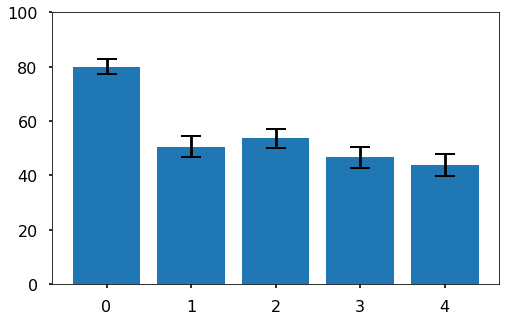